In [1]:
import pandas as pds
import seaborn as sns
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

from __future__ import division
import random
from sklearn import tree
from sklearn import ensemble
from sklearn import metrics
from scipy import stats
#import graphviz
from sklearn.model_selection import train_test_split


from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold 
from sklearn.model_selection import cross_validate 

#for random search cv
from sklearn.model_selection import RandomizedSearchCV

# for grid search
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

# for time measure
import time

from sklearn.metrics import classification_report

%matplotlib inline

# Preprocessons nos données

In [2]:
df = pds.read_csv('titanic/train.csv', sep=",")

sex=[]
for pasenger in df['Sex'] : 
    if (pasenger=='male'):
        sex.append(0)
    else : 
        sex.append(1)
df['Sex']=sex

donnee=df.drop(['PassengerId'], axis=1)
donnee=donnee.drop(['Name'], axis=1)
donnee=donnee.drop(['Ticket'], axis=1)
donnee=donnee.drop(['Cabin'], axis=1)
donnee=donnee.drop(['Embarked'], axis=1)
donnee=donnee.dropna()

In [3]:
age=[]
for x in donnee['Age'] :
    if 0<x<18 : 
        age.append(0)
    elif 18<x<25 : 
        age.append(1)
    elif 25<x<40 : 
        age.append(2)
    else :
        age.append(3)
donnee['Age']=age

# Initialisons notre random forest

In [4]:
survie=[]
for x in donnee["Survived"] : 
    if x==0 : 
        survie.append('mort')
    else : 
        survie.append('survie')

In [5]:
y=donnee["Survived"]
del donnee["Survived"]
print(y.shape, donnee.shape)

(714,) (714, 6)


In [6]:
X_train, X_test, y_train, y_test = train_test_split(donnee,y, test_size=0.15, random_state=10)

### Mise en place du Random Forest
On veut trouver des paramètres optimaux. Cependant, GridSearchCV prend beaucoup trop de temps.
Utilisons alors RandomizedSearchCV.

In [7]:
n_splits=50
start=time.time()
param_grid = {
    "criterion":["gini", "entropy", "log_loss"],
    "max_depth": [1,2,3,4,5,6,7,8,9,10,15,20,None],
    "min_samples_split": [1,2,3,4,5,7,8,9,10],
    "min_samples_leaf": [1,2,3,4,5],
    "n_estimators":[50, 60, 70, 80, 90, 100]
}

model = ensemble.RandomForestClassifier(random_state=42,min_samples_leaf=3,bootstrap=True)
randm_src = RandomizedSearchCV(estimator=model, param_distributions = param_grid,
                               cv = n_splits, n_iter = 10, n_jobs=-1).fit(X_train, y_train)

end=time.time()
print("Param for GS",randm_src.best_params_)
print("CV score for GS", randm_src.best_score_)
print("Train AUC ROC Score for GS: ", roc_auc_score(y_train, randm_src.predict(X_train)))
print("Test AUC ROC Score for GS: ", roc_auc_score(y_test, randm_src.predict(X_test)))

Param for GS {'n_estimators': 50, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_depth': 20, 'criterion': 'log_loss'}
CV score for GS 0.8317948717948718
Train AUC ROC Score for GS:  0.8526937644864039
Test AUC ROC Score for GS:  0.7936507936507937


/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
50 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
50 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py", line 340, in fit
    self._validate_params()
  File "/usr/local/lib/python3.9/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.9/dist-packages/sklearn/utils/_pa

In [8]:
model = ensemble.RandomForestClassifier(random_state=42,bootstrap=True, n_estimators= 90, 
                                        min_samples_split= 7, min_samples_leaf= 3, max_depth=15, 
                                        criterion= 'log_loss')
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

In [9]:
pds.crosstab(y_test,y_predict)

col_0,0,1
Survived,,
0,58,5
1,15,30


In [10]:
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.79      0.92      0.85        63
           1       0.86      0.67      0.75        45

    accuracy                           0.81       108
   macro avg       0.83      0.79      0.80       108
weighted avg       0.82      0.81      0.81       108



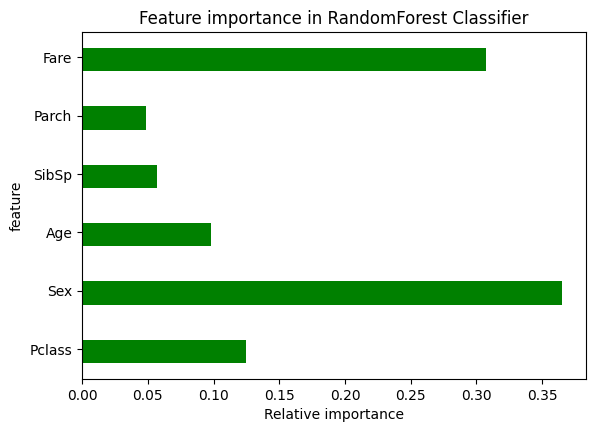

<Figure size 500x500 with 0 Axes>

In [11]:
col = donnee.columns
y = model.feature_importances_
#plot
fig, ax = plt.subplots() 
width = 0.4 # the width of the bars 
ind = np.arange(len(y)) # the x locations for the groups
ax.barh(ind, y, width, color="green")
ax.set_yticks(ind+width/10)
ax.set_yticklabels(col, minor=False)
plt.title('Feature importance in RandomForest Classifier')
plt.xlabel('Relative importance')
plt.ylabel('feature') 
plt.figure(figsize=(5,5))
fig.set_size_inches(6.5, 4.5, forward=True)

In [12]:
fn=donnee.columns
cn=["0","1"]
print(cn)
fig, axes = plt.subplots(nrows = 1,ncols = 4,figsize = (50,20), dpi=900)
for index in range(0, 4):
    tree.plot_tree(model.estimators_[index],
                   feature_names = fn, 
                   class_names=cn,
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('rf_5trees.png')

['0', '1']


# Stabilité de notre méthode 

In [13]:
scoring = ['accuracy']
cv = StratifiedKFold(n_splits=30, random_state=10, shuffle=True)
scores = cross_validate(model, X_train, y_train, scoring=scoring,
                        cv=cv, return_train_score=False)
scores.keys()
print('Global accuracy over all folds: %0.6f (+/- %0.6f)'
      % (scores['test_accuracy'].mean(), scores['test_accuracy'].std() * 2))

Global accuracy over all folds: 0.815714 (+/- 0.193506)
